In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Task1

## 1. Load data

In [2]:
task1_raw_imag = np.load('Task1Data/rawMRData_Imag.npy')
task1_raw_real = np.load('Task1Data/rawMRData_Real.npy')

In [3]:
task1_raw_imag.shape, task1_raw_real.shape

((384, 512, 36), (384, 512, 36))

In [4]:
task1_raw_data = task1_raw_real + 1j*task1_raw_imag
task1_raw_data.shape

(384, 512, 36)

In [5]:
task1_raw_data = task1_raw_data.transpose(2, 0, 1)
task1_raw_data.shape

(36, 384, 512)

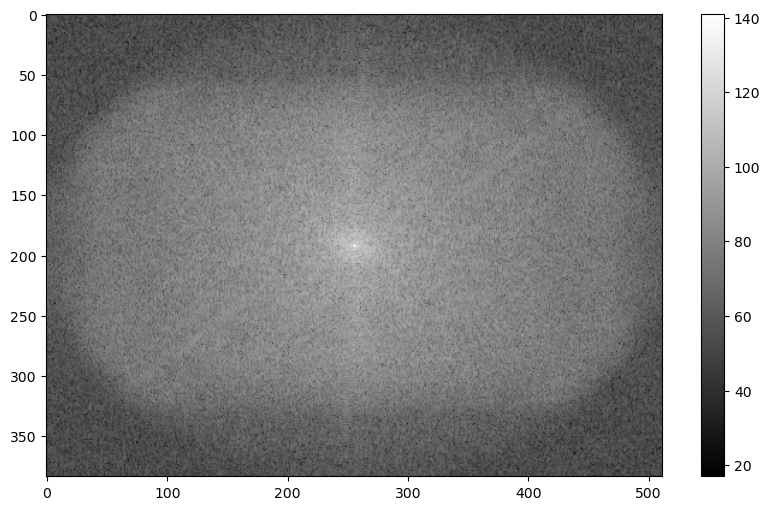

In [6]:
s = task1_raw_data[0]
plt.figure(figsize=(10, 6))
plt.imshow(20*np.log10(np.abs(s)), cmap='gray')
plt.colorbar()
plt.show()

## 2. Image Reconstruction

In [7]:
def img_reconstruction(raw_data):
    raw_data = np.fft.fftshift(raw_data, axes=(1, 2))
    img = np.fft.ifft2(raw_data, axes=(1, 2))
    img = np.abs(img)
    return img

d_origin = img_reconstruction(task1_raw_data)
d_origin.shape

(36, 384, 512)

In [8]:
d_origin[0][0].shape

(512,)

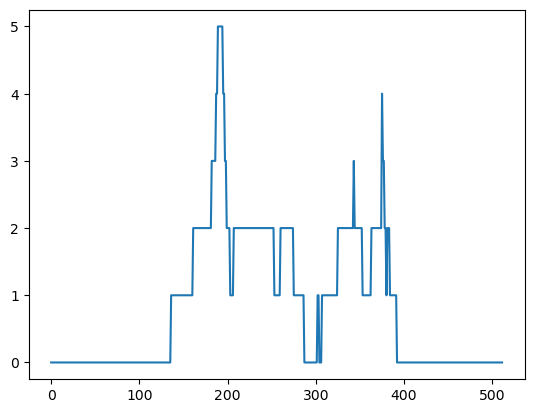

In [9]:
plt.plot(np.abs(d_origin[0][0]))
plt.show()

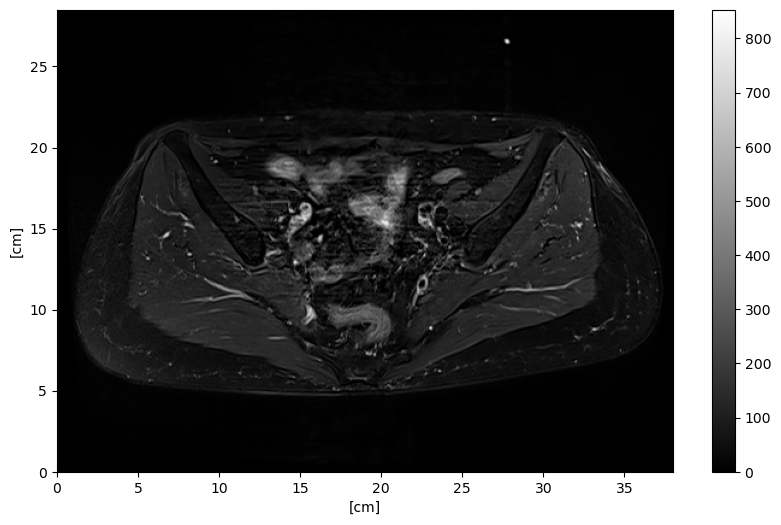

In [10]:
def show_mr_image(img, pixel_spacing=0.7422, r=512, c=384, title=""):
    pixel_spacing /= 10
    plt.figure(figsize=(10, 6))
    plt.imshow(np.abs(img), cmap='gray', extent=[0, r*pixel_spacing, 0, c*pixel_spacing])
    plt.xticks(np.arange(0, r*pixel_spacing, 5))
    plt.yticks(np.arange(0, c*pixel_spacing, 5))
    plt.xlabel('[cm]')
    plt.ylabel('[cm]')
    plt.colorbar()
    plt.title(title)
    plt.show()
show_mr_image(d_origin[0])

## 3. Modify DICOM file

In [11]:
import pydicom
import os

dicom_path = 'Task1Data/blind'
def read_dicom_files(dicom_path):
    dicom_files = dict()
    for file in os.listdir(dicom_path):
        if file.endswith('.dcm'):
            dicom_file = pydicom.dcmread(os.path.join(dicom_path, file))
            l = int(file.split('.')[0])
            dicom_files[l] = dicom_file
    return dicom_files
task1_dicom_files = read_dicom_files(dicom_path)
task1_dicom_files.keys()

dict_keys([18, 24, 30, 31, 25, 19, 33, 27, 26, 32, 22, 23, 21, 35, 9, 8, 34, 20, 5, 11, 10, 4, 12, 6, 7, 13, 17, 3, 2, 16, 0, 14, 28, 29, 15, 1])

In [12]:
save_path = 'Task1Data/modified'
def modify_dicom_files(dicom_files, imgs, save_path):
    for key, file in dicom_files.items():
        file.PixelData = imgs[key].astype(np.uint16).tobytes()
        file.save_as(os.path.join(save_path, f'{key}.dcm'))
modify_dicom_files(task1_dicom_files, d_origin, save_path)


# Task2

## 1. load files and repeat directions in Task1

In [13]:
task2_imag = np.load('Task2Data/rawMRDataNoise_Imag.npy')
task2_real = np.load('Task2Data/rawMRDataNoise_Real.npy')

In [14]:
task2_imag.shape, task2_real.shape

((384, 512, 36), (384, 512, 36))

In [15]:
task2_raw_data = task2_real + 1j*task2_imag
task2_raw_data.shape

(384, 512, 36)

In [16]:
task2_raw_data = task2_raw_data.transpose(2, 0, 1)
task2_raw_data.shape

(36, 384, 512)

In [17]:
d_shifted = np.fft.fftshift(task2_raw_data, axes=(1, 2))
d = np.fft.ifft2(d_shifted, axes=(1, 2))
d = np.abs(d)
d.shape

(36, 384, 512)

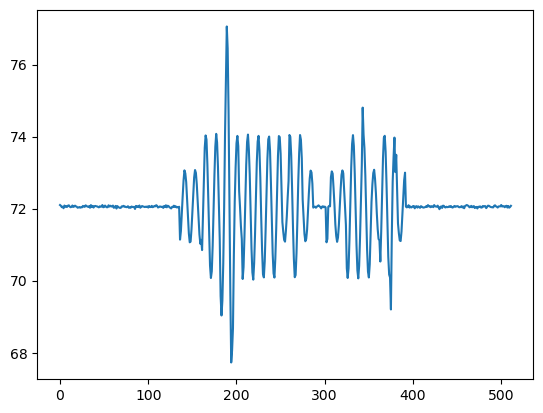

In [18]:
plt.plot(np.abs(d[0][0]))
plt.show()

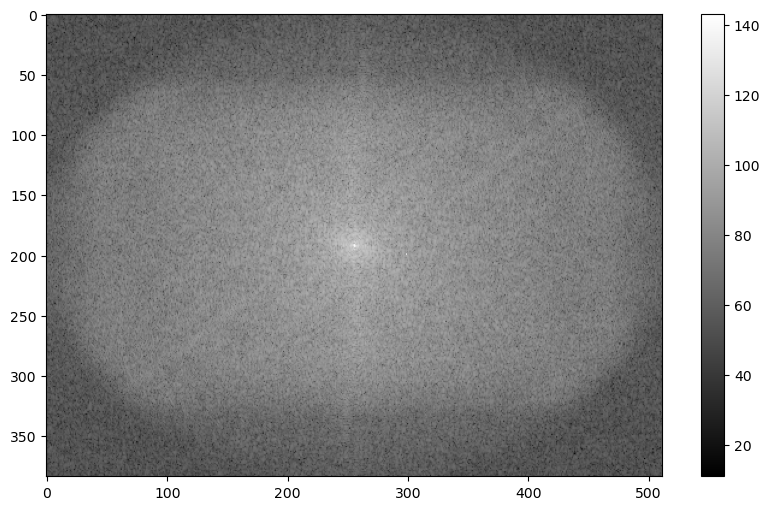

In [19]:
s_2 = task2_raw_data[0]
plt.figure(figsize=(10, 6))
plt.imshow(20*np.log10(np.abs(s_2)), cmap='gray')
plt.colorbar()
plt.show()


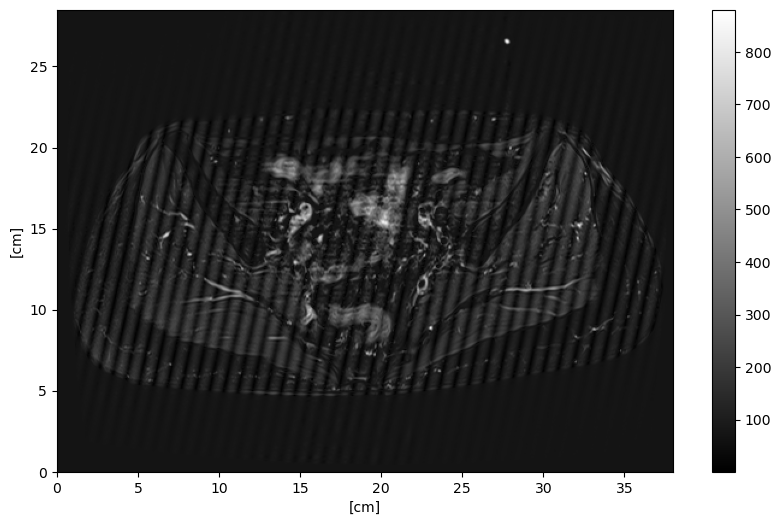

In [20]:
show_mr_image(d[0])

## 2. Remove noise and artifacts

### 2-1. remove dignoal

In [21]:
mats = []
max_mats = []
max_cols = []
for l in range(task2_raw_data.shape[0]):
    s = task2_raw_data[l]
    mat = np.zeros_like(s)
    max_mat = np.max(s, axis=1)
    max_col = np.argmax(s, axis=1)
    mat[np.arange(s.shape[0]), max_col] = max_mat
    mats.append(mat)
    max_mats.append(max_mat)
    max_cols.append(max_col)
mats = np.array(mats)
max_mats = np.array(max_mats)
max_cols = np.array(max_cols)    

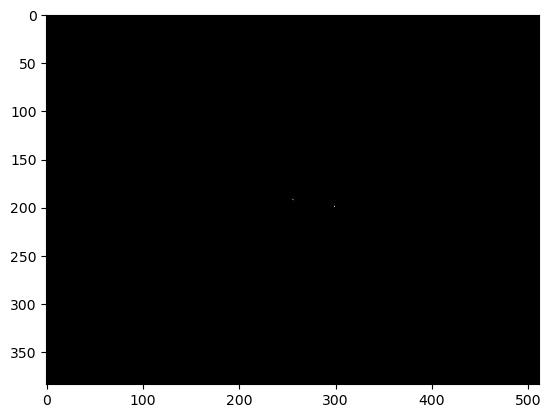

In [22]:
plt.imshow(np.abs(mats[0]), cmap='gray')
# plt.colorbar()
plt.show()

In [23]:
max_coords = []
for l in range(task2_raw_data.shape[0]):
    max_coord = []
    max_col = max_cols[l]
    max_mat = max_mats[l]
    for i in range(2):
        r = np.argmax(max_mat)
        c = max_col[r]
        max_coord.append([r, c])
        max_mat[r] = 0
    max_coords.append(max_coord)

In [24]:
max_coords[0]

[[192, 256], [199, 299]]

In [25]:
rm_dignoal = []
for l in range(task2_raw_data.shape[0]):
    ones = np.ones_like(task2_raw_data[l])
    max_coord = max_coords[l]
    for coord in max_coord:
        ones[coord[0], coord[1]] = 0
    rm_d = task2_raw_data[l] * ones
    rm_dignoal.append(rm_d)

rm_dignoal = np.array(rm_dignoal)

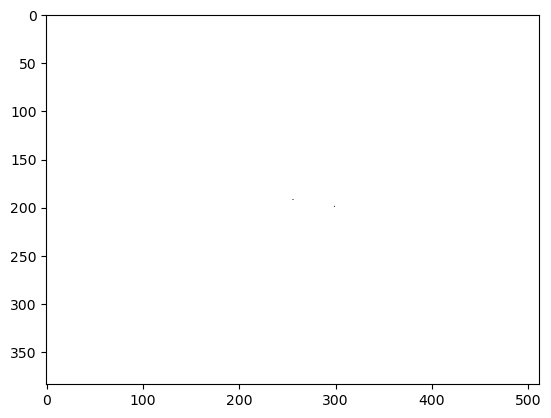

In [26]:
plt.imshow(np.abs(ones), cmap='gray')

In [27]:
rm_d = img_reconstruction(rm_dignoal)

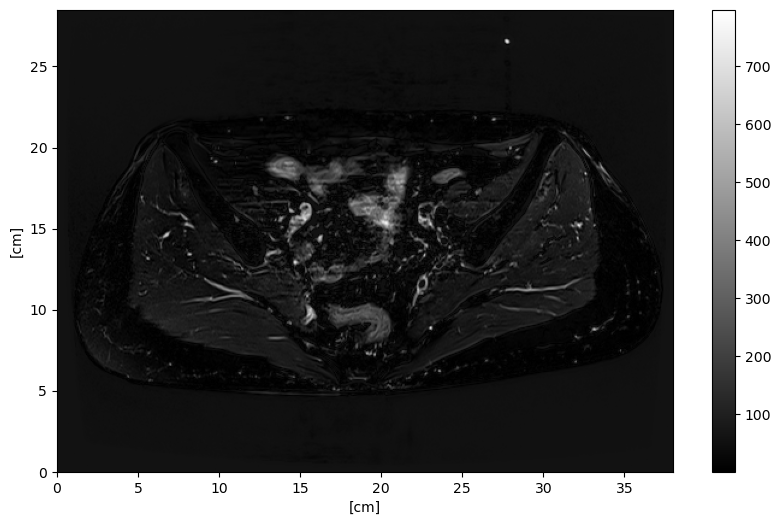

In [28]:
show_mr_image(rm_d[0])

#### 2-2. Log Transformation / Power-Law(Gamma) Transformation

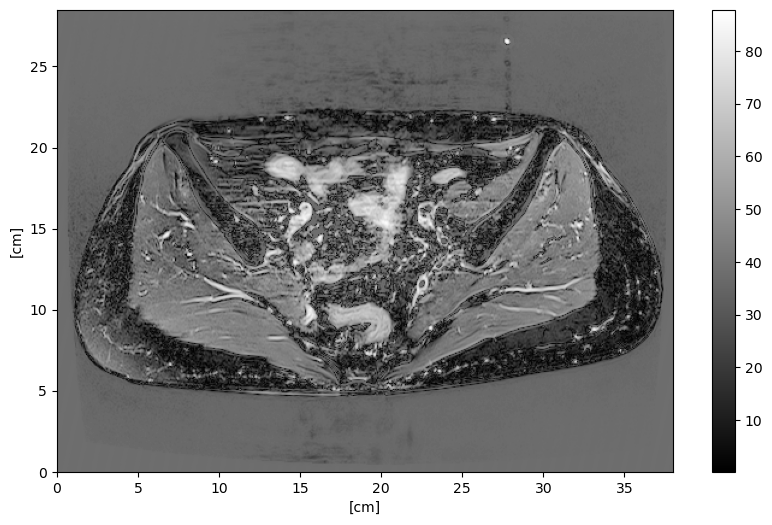

In [29]:
log_rm_d = 20 * np.log(rm_d+10)
log_rm_d = log_rm_d - np.min(log_rm_d)
show_mr_image(log_rm_d[0])

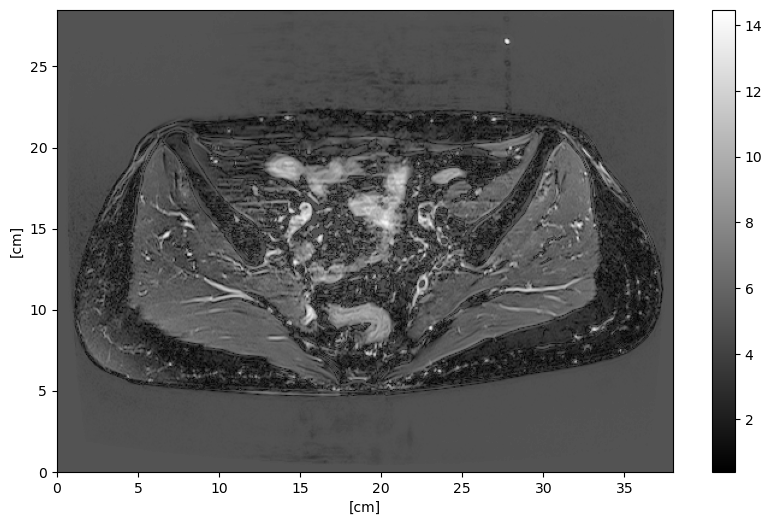

In [30]:
power_law_rm_d = np.power(rm_d, 0.4)
show_mr_image(power_law_rm_d[0])

### 3. modify dicom

In [31]:
task2_dicom_files = read_dicom_files('Task1Data/blind')
save_path = 'Task2Data/modified'
modify_dicom_files(task2_dicom_files, rm_d, save_path)

# Task3

## 1-1. load dicom files

In [32]:
# dicom documenation
# https://pydicom.github.io/pydicom/stable/auto_examples/image_processing/reslice.html#sphx-glr-auto-examples-image-processing-reslice-py

In [33]:
import pydicom

dicom_path = 'Task3Data/blind'
task3_dicom_files = read_dicom_files('Task3Data/blind')

In [34]:
task3_dicom_files[0]

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 226
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.3.6.1.4.1.9590.100.1.2.271988646011540584515081711502032149853
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.3.6.1.4.1.9590.100.1.3.100.9.4
(0002, 0013) Implementation Version Name         SH: 'MATLAB IPT 9.4'
(0002, 0016) Source Application Entity Title     AE: 'MAROTECH'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL', 'GSI MONO']
(0008, 0012) Instance Creation Date              DA: '20180427'
(0008, 0013) Instance Creation Time              TM: '102217'
(

In [35]:
task3_dicom_meta = dict()
task3_slices = dict()
for key, file in task3_dicom_files.items():
    task3_dicom_meta[key] = {
        'pixel_spacing': file.PixelSpacing,
        'slice_thickness': file.SliceThickness,
        'spacing_location': file.SliceLocation
    }
    task3_slices[key] = file.pixel_array
temp = list()
for i in range(len(task3_slices)):
    temp.append(np.maximum(0, task3_slices[i]))
task3_slices = np.array(temp)

In [36]:
len(task3_dicom_meta), task3_dicom_meta[0], task3_slices.shape

(125,
 {'pixel_spacing': [0.832031, 0.832031],
  'slice_thickness': '2.5',
  'spacing_location': '-80.0'},
 (125, 512, 512))

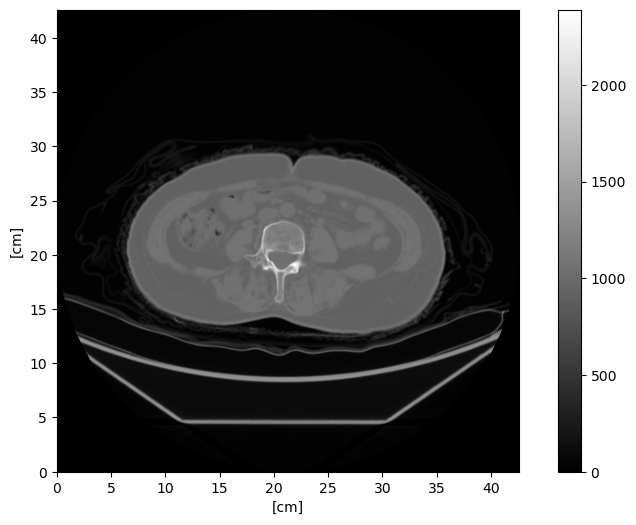

In [37]:
show_mr_image(task3_slices[0], task3_dicom_meta[0]['pixel_spacing'][0], r=task3_slices.shape[1], c=task3_slices.shape[2])

## 1-2. plot the axial, sagittal, coronal image

In [38]:
# save the aspect ratio of each slice
task3_aspect = dict()
for i in range(len(task3_slices)):
    ps = task3_dicom_meta[i]['pixel_spacing']
    ss = task3_dicom_meta[i]['slice_thickness']
    ax_aspect = ps[1] / ps[0]
    sag_aspect = ps[1] / ss
    cor_aspect = ss / ps[0]
    task3_aspect[i] = {
        'ax_aspect': ax_aspect,
        'sag_aspect': sag_aspect,
        'cor_aspect': cor_aspect
    }


In [39]:
task3_aspect[0]

{'ax_aspect': 1.0, 'sag_aspect': 0.3328124, 'cor_aspect': 3.004695738500128}

In [40]:
task3_img3d = task3_slices.transpose(1, 2, 0)

In [41]:
task3_img3d.shape

(512, 512, 125)

In [42]:
task3_img3d[:,:,0]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int16)

In [43]:
(task3_dicom_meta[0]['pixel_spacing'][0])

'0.832031'

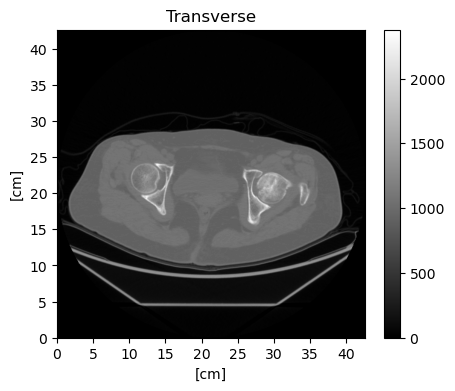

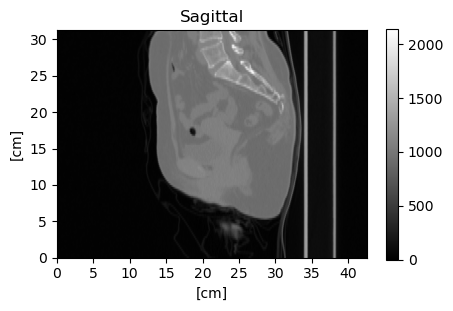

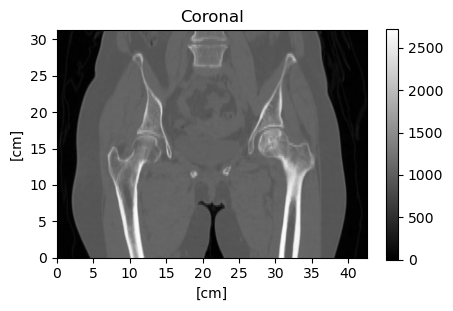

In [44]:
def show_transverse_image(img3d, loc, meta_data):
    pixcel_spacing = meta_data['pixel_spacing'][0] / 10
    r = img3d.shape[0]
    c = img3d.shape[1]
    plt.figure(figsize=(5, 4))
    plt.imshow(img3d[:, :, loc], cmap='gray', extent=[0, r*pixcel_spacing, 0, c*pixcel_spacing])
    # plt.imshow(img3d[:, :, loc], cmap='gray')
    plt.xticks(np.arange(0, r*pixcel_spacing, 5))
    plt.yticks(np.arange(0, c*pixcel_spacing, 5))
    plt.title('Transverse')
    plt.xlabel('[cm]')
    plt.ylabel('[cm]')
    plt.colorbar()
    plt.show()

def show_sagittal_image(img3d, loc, aspect, meta_data):
    pixcel_spacing = meta_data['pixel_spacing'][0] / 10
    height_spacing = meta_data['slice_thickness'] / 10
    r = img3d.shape[0]
    c = img3d.shape[2]
    plt.figure(figsize=(5, 3))
    plt.imshow(img3d[:, loc, :].T, cmap='gray', extent=[0, r*height_spacing, 0, c*pixcel_spacing], aspect=1/(aspect**2))
    plt.xticks(np.arange(0, r*height_spacing, 5*(1/aspect)), [f'{5*i}' for i in range(len(np.arange(0, r*height_spacing, 5*(1/aspect))))])
    plt.yticks(np.arange(0, c*pixcel_spacing, 5*aspect), [f'{5*i}' for i in range(len(np.arange(0, c*pixcel_spacing, 5*aspect)))])
    plt.title('Sagittal')
    plt.xlabel('[cm]')
    plt.ylabel('[cm]')
    plt.colorbar()
    plt.show()

def show_coronal_image(img3d, loc, aspect, meta_data):
    pixcel_spacing = meta_data['pixel_spacing'][0] / 10
    height_spacing = meta_data['slice_thickness'] / 10
    r = img3d.shape[2]
    c = img3d.shape[1]
    plt.figure(figsize=(5, 3))
    plt.imshow(img3d[loc, :, :].T, cmap='gray', extent=[0, c*pixcel_spacing, 0, r*height_spacing])
    plt.xticks(np.arange(0, c*pixcel_spacing, 5))
    plt.yticks(np.arange(0, r*height_spacing, 5))
    plt.title('Coronal')
    plt.xlabel('[cm]')
    plt.ylabel('[cm]')
    plt.colorbar()
    plt.show()

loc_tr = task3_img3d.shape[2] // 2    # axial range 0-125
loc_sag = task3_img3d.shape[1] // 2   # sagittal range 0-511
loc_cor = task3_img3d.shape[0] // 2   # coronal range 0-511

show_transverse_image(task3_img3d, loc_tr, task3_dicom_meta[0])
show_sagittal_image(task3_img3d, loc_sag, task3_aspect[0]['sag_aspect'], task3_dicom_meta[0])
show_coronal_image(task3_img3d, loc_cor, task3_aspect[0]['cor_aspect'], task3_dicom_meta[0])

## 2. segmentation bone

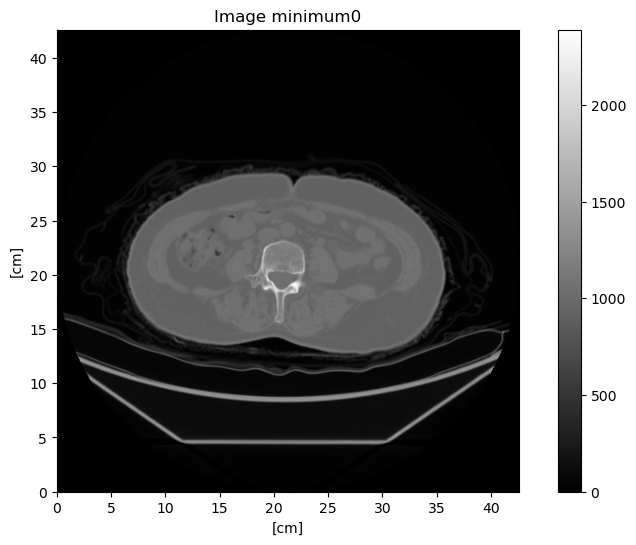

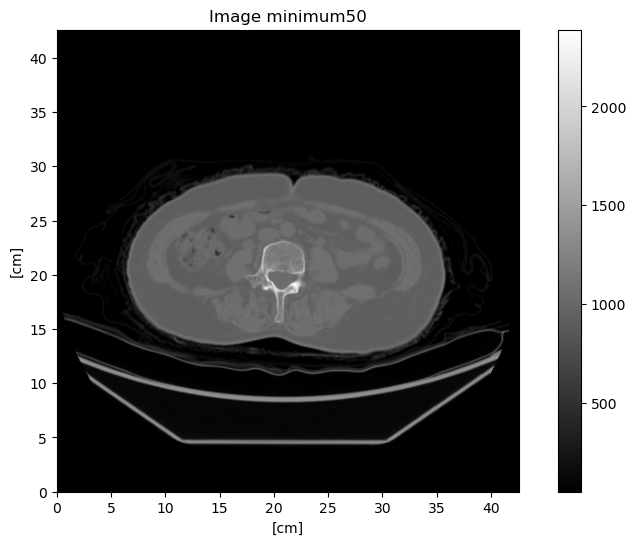

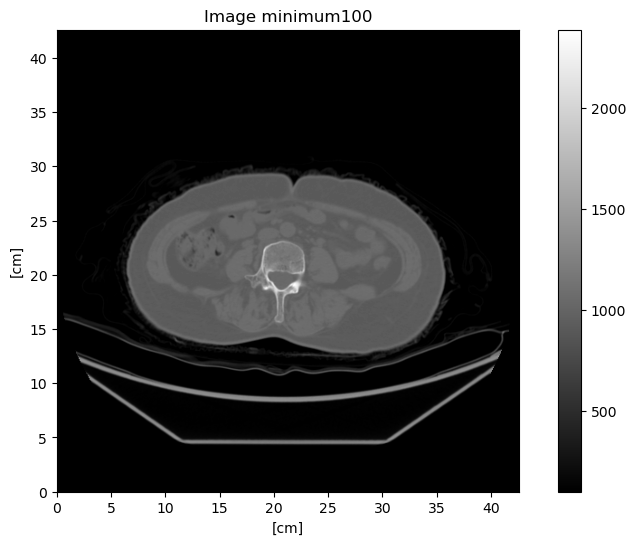

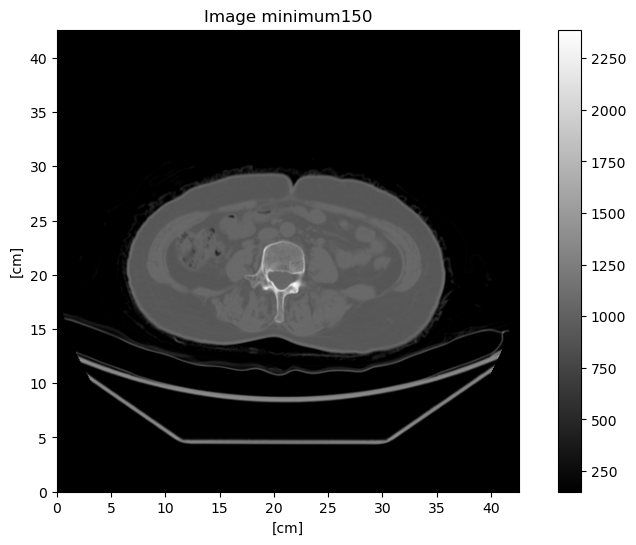

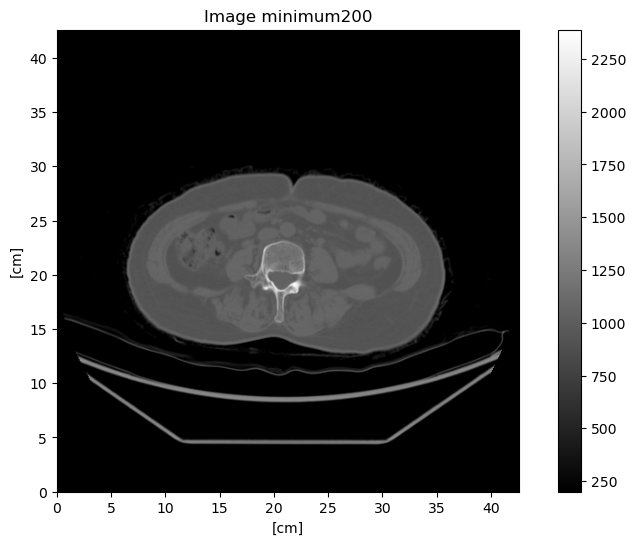

...

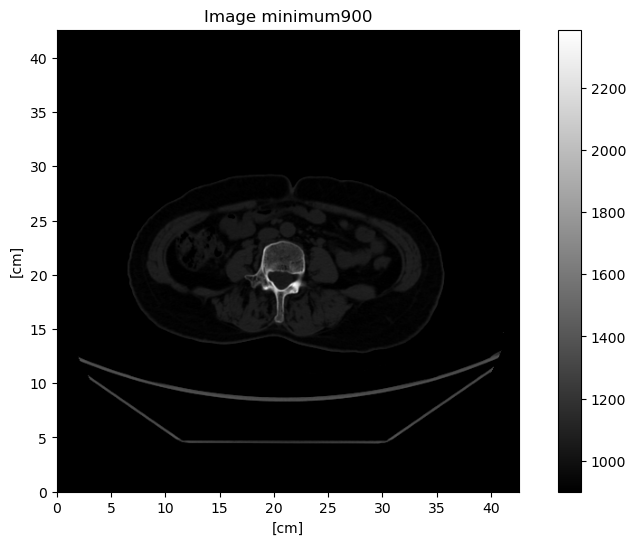

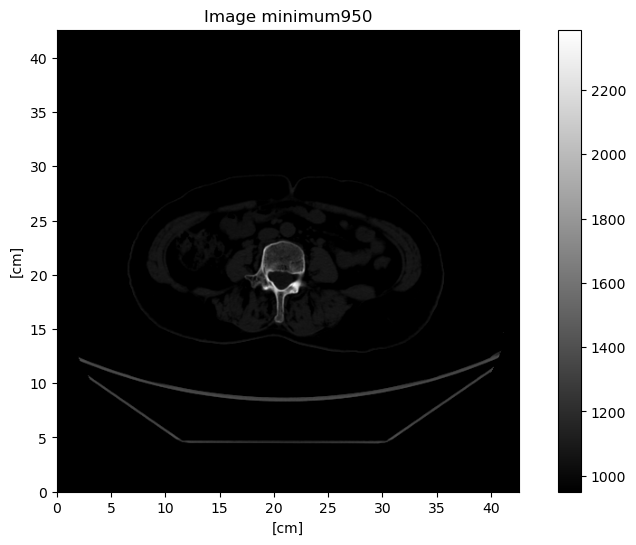

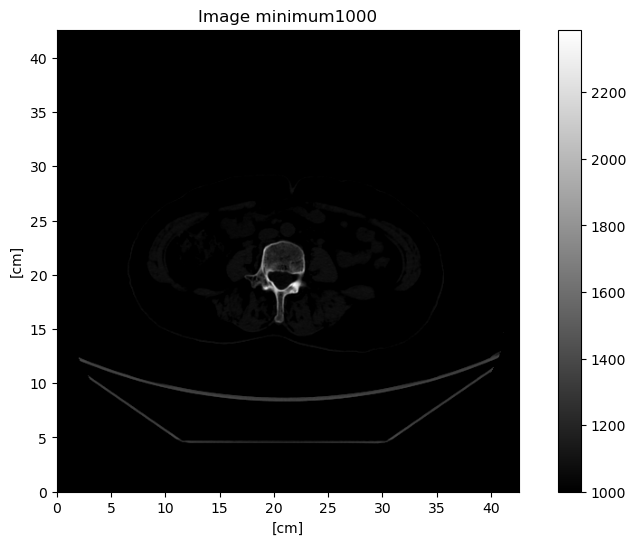

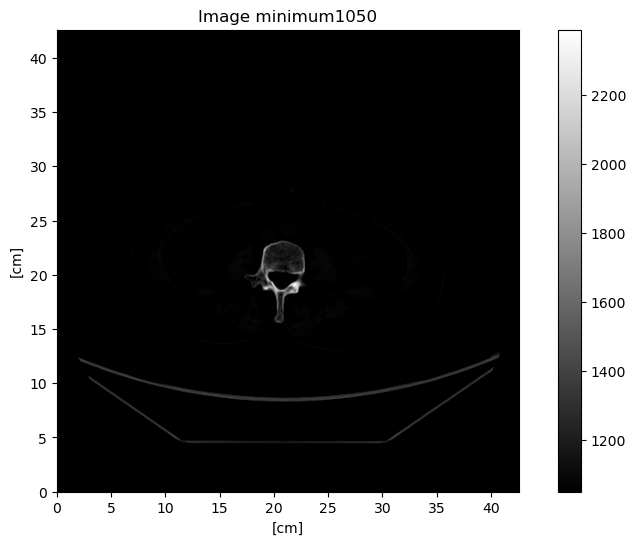

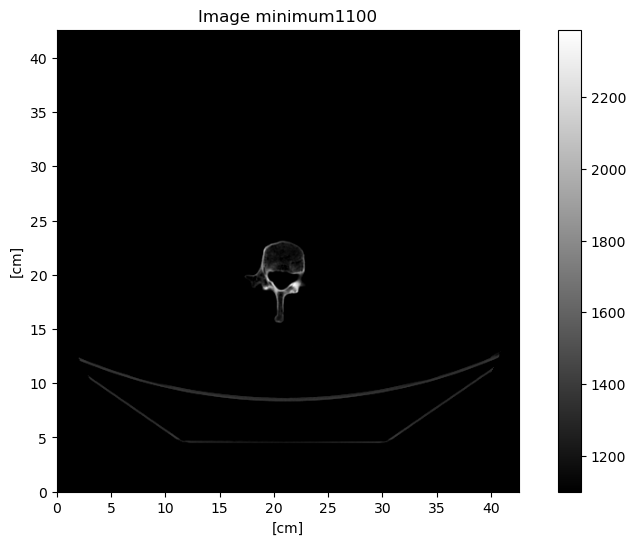

In [45]:
test = task3_img3d[:, :, 0]
for i in range(0, 1101, 50):
    test = np.maximum(i, test)
    show_mr_image(test, task3_dicom_meta[0]['pixel_spacing'][0], r=test.shape[0], c=test.shape[1], title=f'Image minimum{i}')


(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int16),
 <matplotlib.image.AxesImage at 0x13faddeb0>)

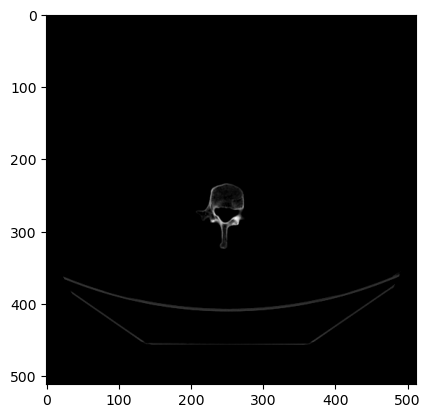

In [46]:
test = test - np.min(test)
test, plt.imshow(test, cmap='gray')

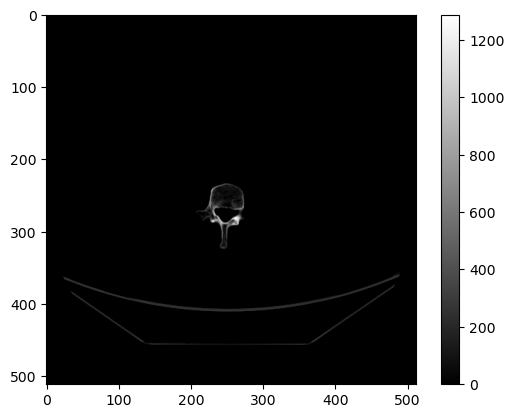

In [47]:
bone_filter = np.ones_like(test)
test = test * bone_filter
plt.imshow((test), cmap='gray')
plt.colorbar()
plt.show()

In [48]:
def fill_mean(img):
    for r in range(1, img.shape[0]-1):
        for c in range(1,img.shape[1]-1):
            if img[r, c] == 0:
                img[r, c] = (img[r-1, c-1] + img[r-1, c] + img[r-1, c+1] + img[r, c-1] + img[r, c+1] + img[r+1, c-1] + img[r+1, c] + img[r+1, c+1]) / 8
    return img

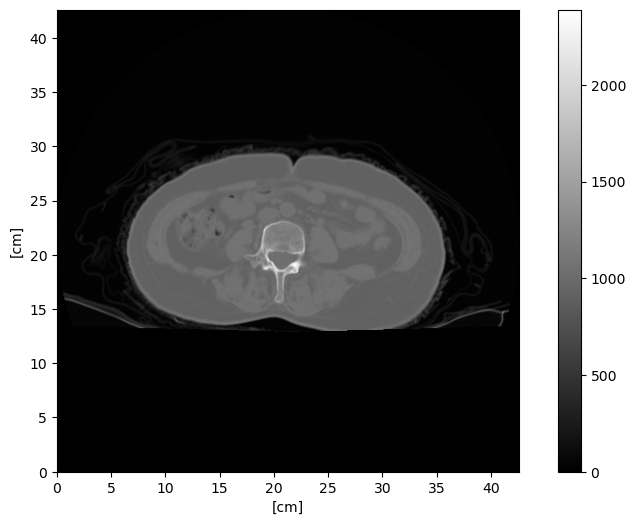

In [49]:
def remove_plate(img3d):
    remove_filter = np.ones_like(img3d[:,:,0])
    height = 350
    for l in range(img3d.shape[2]):
        for c in range(256):
            remove_filter[height:, c] = 0
            if c % 40 == 0:
                height += 1
        for c in range(256, 512):
            remove_filter[height:, c] = 0
            if c % 40 == 0:
                height -= 1
    remove_filter = np.array([remove_filter for _ in range(img3d.shape[2])])
    remove_filter = remove_filter.transpose(1, 2, 0)
    return img3d * remove_filter
rm_plate_test = remove_plate(task3_img3d)
show_mr_image(rm_plate_test[:,:,0], task3_dicom_meta[0]['pixel_spacing'][0], r=task3_img3d.shape[0], c=task3_img3d.shape[1])

In [50]:
def bone_filtering(img3d):
    segmented_img = list()
    img3d = remove_plate(img3d)
    for i in range(img3d.shape[2]):
        img = img3d[:,:,i]
        img = np.maximum(1100, img)
        img = img - np.min(img)
        bone_filter = np.ones_like(img)
        img = img * bone_filter
        img = fill_mean(img)
        segmented_img.append(img)
    segmented_img = np.array(segmented_img)
    segmented_img = segmented_img.transpose(1, 2, 0)
    return segmented_img

In [51]:
segmented_bone_3d_img = bone_filtering(task3_img3d)

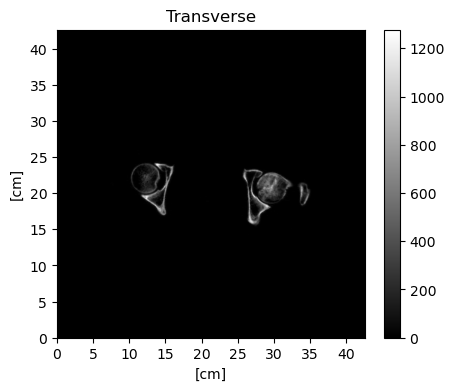

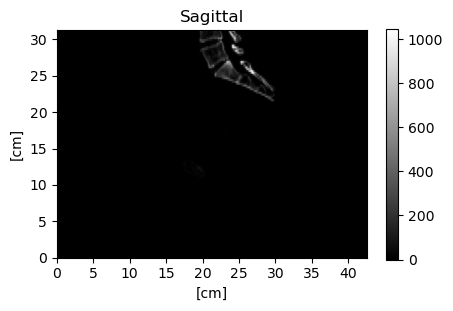

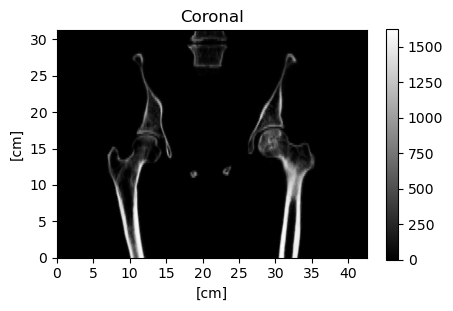

In [52]:
show_transverse_image(segmented_bone_3d_img, loc_tr, task3_dicom_meta[0])
show_sagittal_image(segmented_bone_3d_img, loc_sag, task3_aspect[0]['sag_aspect'], task3_dicom_meta[0])
show_coronal_image(segmented_bone_3d_img, loc_cor, task3_aspect[0]['cor_aspect'], task3_dicom_meta[0])

## 3. extract edges using 2D wavelet

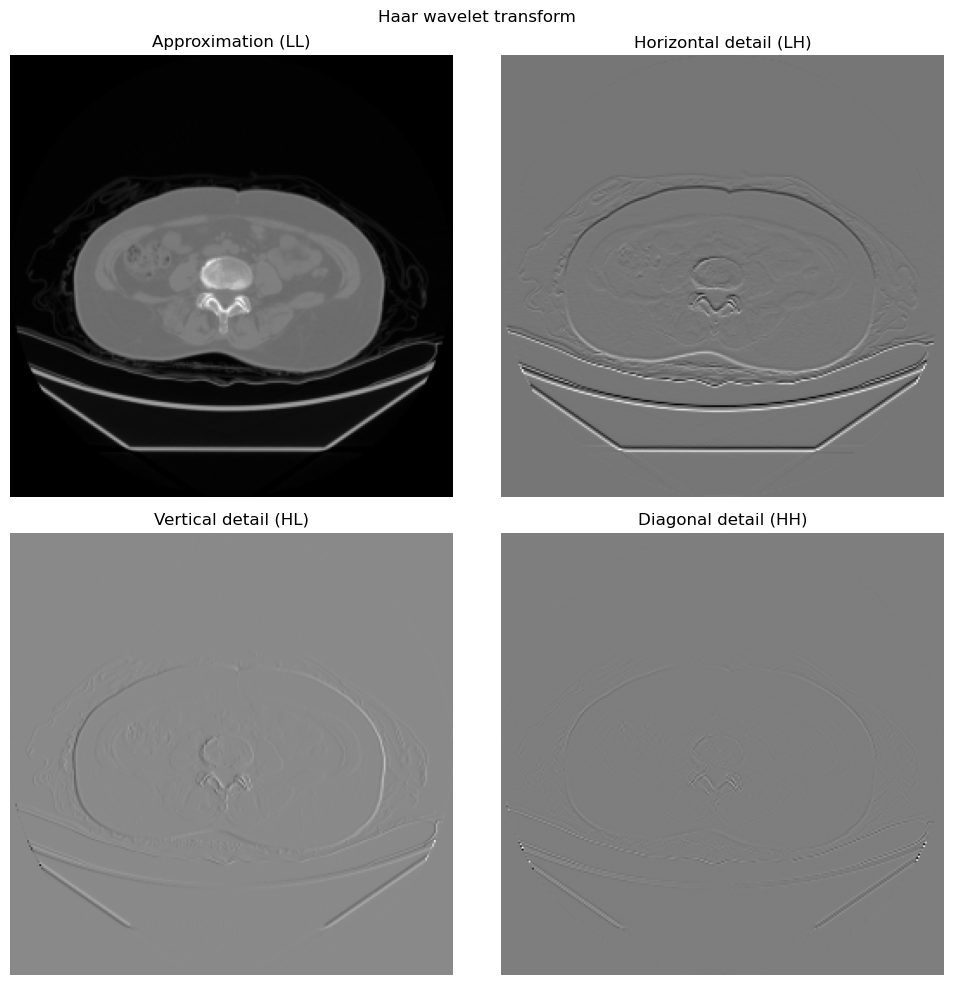

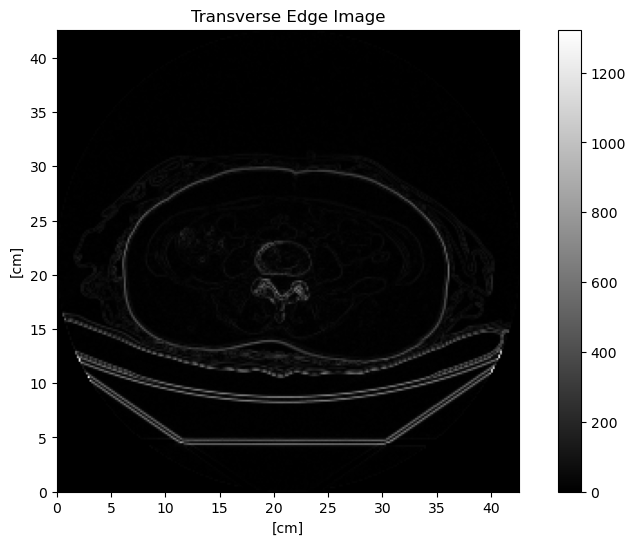

In [53]:
import pywt

img = task3_img3d[:,:,4]
# img = segmented_bone_3d_img[:,:,9]
coeffs2 = pywt.dwt2(img, 'haar')
LL, (LH, HL, HH) = coeffs2

pixcel_spacing = task3_dicom_meta[0]['pixel_spacing'][0] / 10
height_spacing = task3_dicom_meta[0]['slice_thickness'] / 10
r = segmented_bone_3d_img.shape[0]
c = segmented_bone_3d_img.shape[1]

fig, ax = plt.subplots(2, 2, figsize=(10, 10))
fig.suptitle('Haar wavelet transform')
ax[0, 0].imshow(LL, cmap='gray', extent=[0, r*pixcel_spacing, 0, c*pixcel_spacing])
ax[0, 0].axis('off')
ax[0, 0].set_title('Approximation (LL)')
ax[0, 1].imshow(LH, cmap='gray', extent=[0, r*pixcel_spacing, 0, c*pixcel_spacing])
ax[0, 1].axis('off')
ax[0, 1].set_title('Horizontal detail (LH)')
ax[1, 0].imshow(HL, cmap='gray', extent=[0, r*pixcel_spacing, 0, c*pixcel_spacing])
ax[1, 0].axis('off')
ax[1, 0].set_title('Vertical detail (HL)')
ax[1, 1].imshow(HH, cmap='gray', extent=[0, r*pixcel_spacing, 0, c*pixcel_spacing])
ax[1, 1].axis('off')
ax[1, 1].set_title('Diagonal detail (HH)')
fig.tight_layout()
plt.show()

edge_img = np.sqrt((LH**2) + (HL**2) + HH**2)


show_mr_image(edge_img, task3_dicom_meta[0]['pixel_spacing'][0], r=segmented_bone_3d_img.shape[0], c=segmented_bone_3d_img.shape[1], title='Transverse Edge Image')

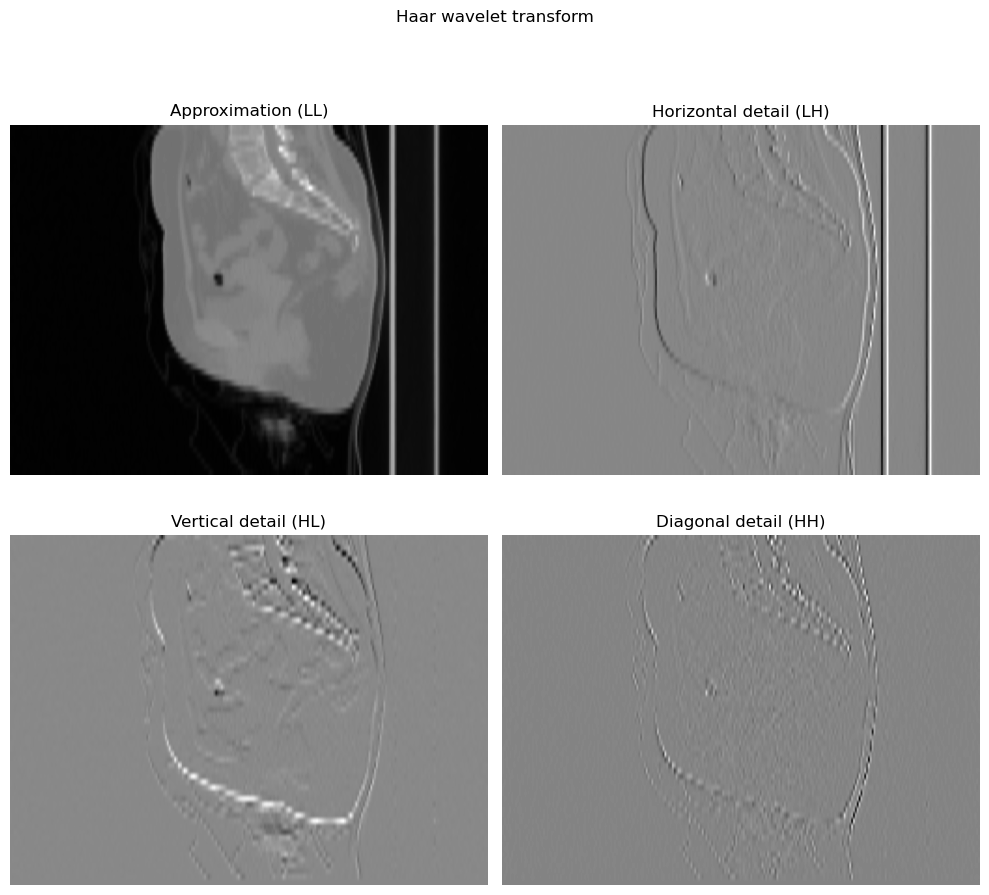

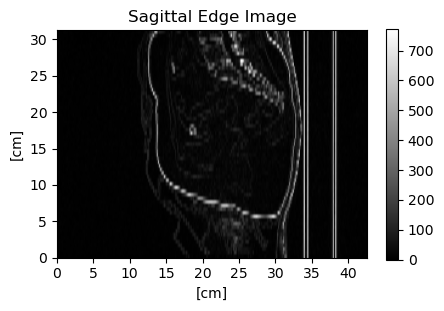

In [54]:
import pywt
# sagittal
img = task3_img3d[:, 256, :]
# img = segmented_bone_3d_img[:,240,:]
coeffs2 = pywt.dwt2(img, 'haar')
LL, (LH, HL, HH) = coeffs2

pixcel_spacing = task3_dicom_meta[0]['pixel_spacing'][0] / 10
height_spacing = task3_dicom_meta[0]['slice_thickness'] / 10
r = segmented_bone_3d_img.shape[0]
c = segmented_bone_3d_img.shape[2]
aspect = 1/(task3_aspect[0]['sag_aspect']**2)

fig, ax = plt.subplots(2, 2, figsize=(10, 10))
fig.suptitle('Haar wavelet transform')
ax[0, 0].imshow(LL.T, cmap='gray', extent=[0, r*height_spacing, 0, c*pixcel_spacing], aspect=aspect)
ax[0, 0].axis('off')
ax[0, 0].set_title('Approximation (LL)')
ax[0, 1].imshow(LH.T, cmap='gray', extent=[0, r*height_spacing, 0, c*pixcel_spacing], aspect=aspect)
ax[0, 1].axis('off')
ax[0, 1].set_title('Horizontal detail (LH)')
ax[1, 0].imshow(HL.T, cmap='gray', extent=[0, r*height_spacing, 0, c*pixcel_spacing], aspect=aspect)
ax[1, 0].axis('off')
ax[1, 0].set_title('Vertical detail (HL)')
ax[1, 1].imshow(HH.T, cmap='gray', extent=[0, r*height_spacing, 0, c*pixcel_spacing], aspect=aspect)
ax[1, 1].axis('off')
ax[1, 1].set_title('Diagonal detail (HH)')
fig.subplots_adjust(top=1.02)
fig.tight_layout()
plt.show()

edge_img = np.sqrt(LH**2 + HL**2 + HH**2)
aspect = task3_aspect[0]['sag_aspect']

plt.figure(figsize=(5, 3))
plt.imshow(edge_img.T, cmap='gray', extent=[0, r*height_spacing, 0, c*pixcel_spacing], aspect=1/(aspect**2))
plt.xticks(np.arange(0, r*height_spacing, 5*(1/aspect)), [f'{5*i}' for i in range(len(np.arange(0, r*height_spacing, 5*(1/aspect))))])
plt.yticks(np.arange(0, c*pixcel_spacing, 5*aspect), [f'{5*i}' for i in range(len(np.arange(0, c*pixcel_spacing, 5*aspect)))])
plt.title('Sagittal Edge Image')
plt.xlabel('[cm]')
plt.ylabel('[cm]')
plt.colorbar()
plt.show()

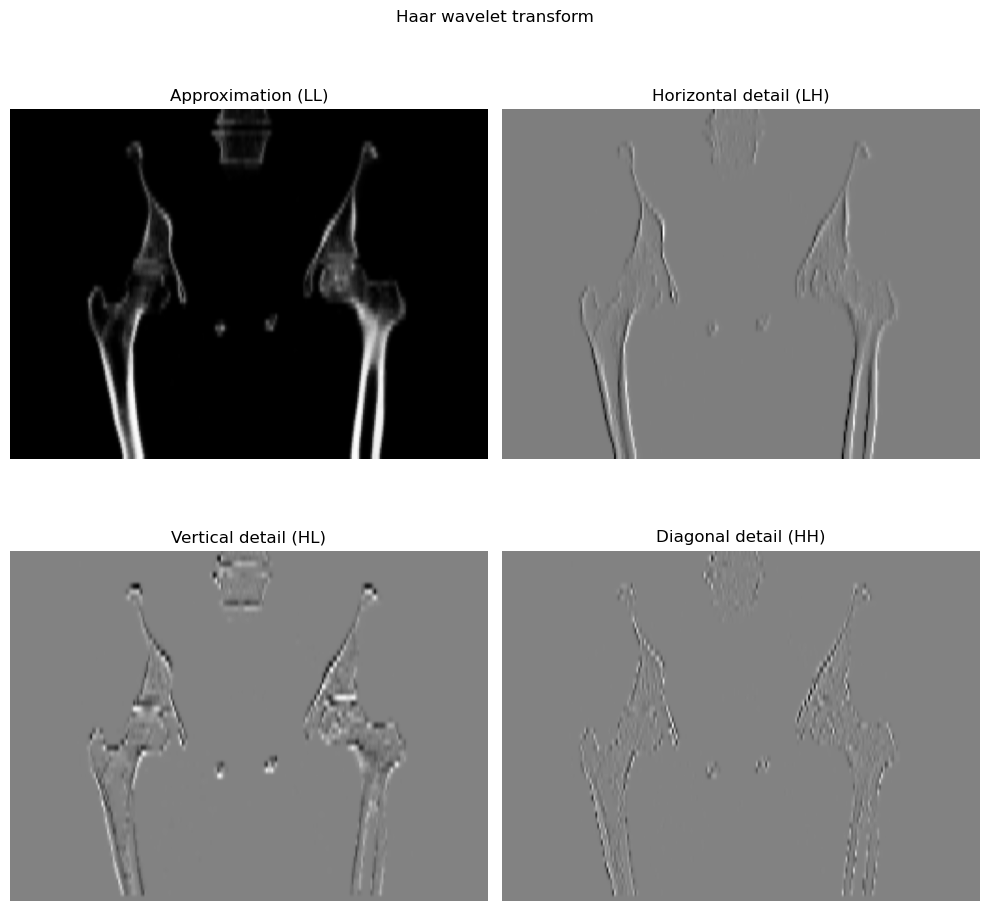

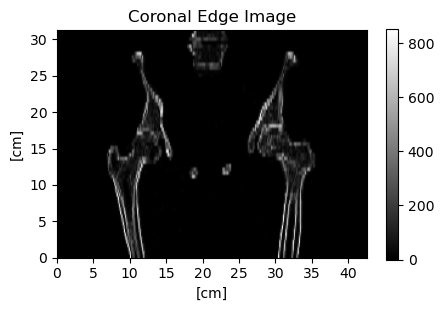

In [55]:
# coronal
img = segmented_bone_3d_img[256,:,:]
coeffs2 = pywt.dwt2(img, 'haar')
LL, (LH, HL, HH) = coeffs2

pixcel_spacing = task3_dicom_meta[0]['pixel_spacing'][0] / 10
height_spacing = task3_dicom_meta[0]['slice_thickness'] / 10
r = segmented_bone_3d_img.shape[2]
c = segmented_bone_3d_img.shape[1]

fig, ax = plt.subplots(2, 2, figsize=(10, 10))
fig.suptitle('Haar wavelet transform')
ax[0, 0].imshow(LL.T, cmap='gray', extent=[0, c*pixcel_spacing, 0, r*height_spacing])
ax[0, 0].axis('off')
ax[0, 0].set_title('Approximation (LL)')
ax[0, 1].imshow(LH.T, cmap='gray', extent=[0, c*pixcel_spacing, 0, r*height_spacing])
ax[0, 1].axis('off')
ax[0, 1].set_title('Horizontal detail (LH)')
ax[1, 0].imshow(HL.T, cmap='gray', extent=[0, c*pixcel_spacing, 0, r*height_spacing])
ax[1, 0].axis('off')
ax[1, 0].set_title('Vertical detail (HL)')
ax[1, 1].imshow(HH.T, cmap='gray', extent=[0, c*pixcel_spacing, 0, r*height_spacing])
ax[1, 1].axis('off')
ax[1, 1].set_title('Diagonal detail (HH)')
fig.tight_layout()
plt.show()

edge_img = np.sqrt(LH**2 + HL**2 + HH**2)
plt.figure(figsize=(5, 3))
plt.imshow(edge_img.T, cmap='gray', extent=[0, c*pixcel_spacing, 0, r*height_spacing])
plt.xticks(np.arange(0, c*pixcel_spacing, 5))
plt.yticks(np.arange(0, r*height_spacing, 5))
plt.title('Coronal Edge Image')
plt.xlabel('[cm]')
plt.ylabel('[cm]')
plt.colorbar()
plt.show()


# Task 4

## 1. load image

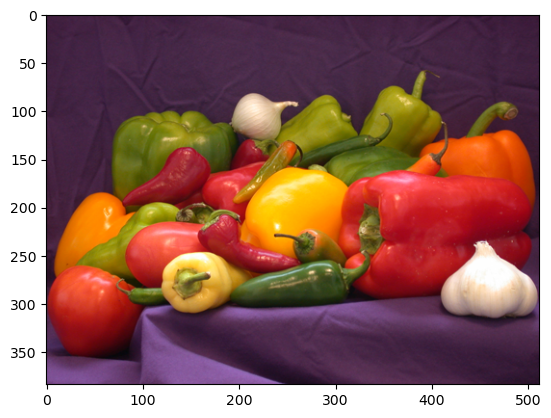

In [56]:
import cv2

task4_original = cv2.imread('Task4Data/pepperImage.png') #BGR
task4_original = cv2.cvtColor(task4_original, cv2.COLOR_BGR2RGB)
# task4_original = task4_original / 255.0
task4_original.shape, plt.imshow(task4_original)
plt.show()

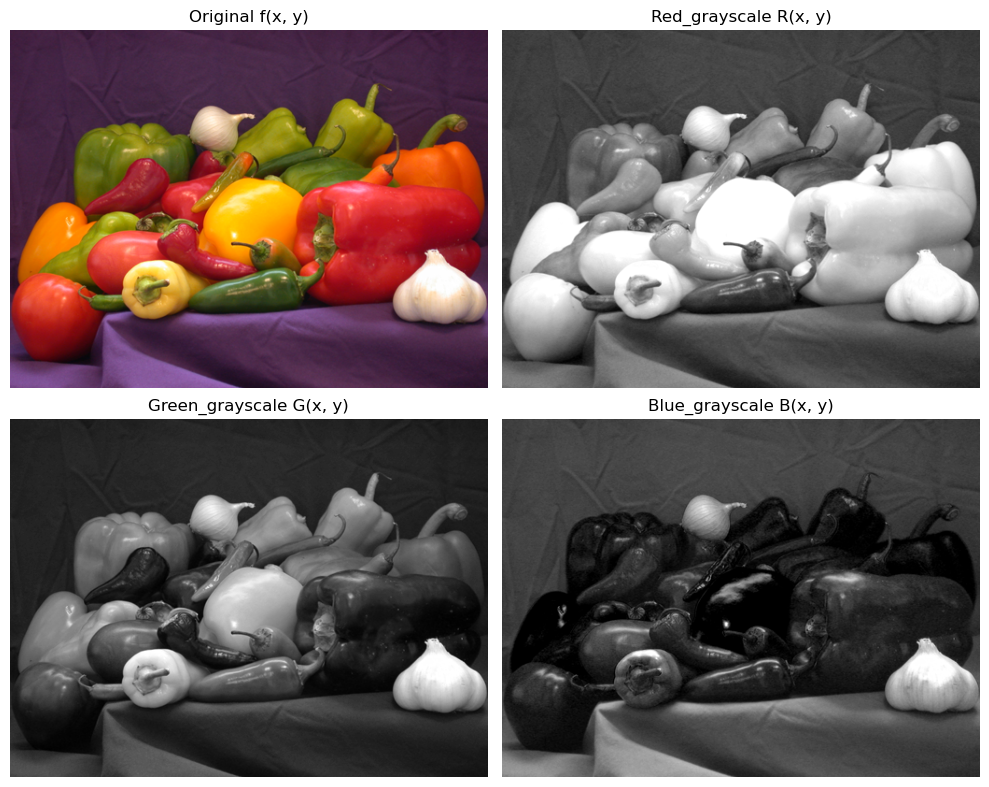

In [169]:
fig, ax = plt.subplots(2, 2, figsize=(10, 8))

ax[0, 0].imshow(task4_original)
ax[0, 0].set_title('Original f(x, y)')
ax[0, 0].axis('off')
ax[0, 1].imshow(task4_original[:,:,0], cmap='gray')
ax[0, 1].set_title('Red_grayscale R(x, y)')
ax[0, 1].axis('off')
ax[1, 0].imshow(task4_original[:,:,1], cmap='gray')
ax[1, 0].set_title('Green_grayscale G(x, y)')
ax[1, 0].axis('off')
ax[1, 1].imshow(task4_original[:,:,2], cmap='gray')
ax[1, 1].set_title('Blue_grayscale B(x, y)')
ax[1, 1].axis('off')
plt.tight_layout()
plt.show()

## 2. modify the red component and plot the modified image

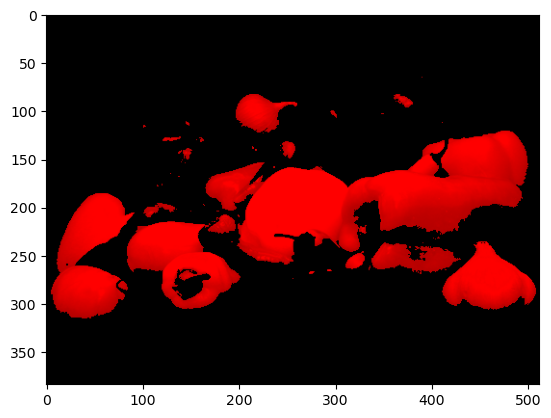

In [58]:
task4_o_img = np.zeros_like(task4_original[:,:,0])
task4_r_img = task4_original[:,:,0]
task4_r_filter = task4_r_img > 180
task4_r_filter = task4_r_filter.astype(np.uint8)
task4_r_img = task4_r_img * task4_r_filter
task4_r_img = [task4_r_img, task4_o_img, task4_o_img]
task4_r_img = np.array(task4_r_img)
task4_r_img = task4_r_img.transpose(1, 2, 0)
plt.imshow(task4_r_img)

## 3. Only reddish peppers and reddish chili peppers

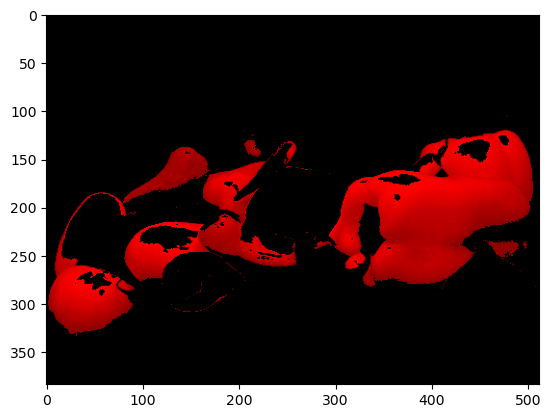

In [158]:
def inverse_filter(filter):
    for r in range(filter.shape[0]):
        for c in range(filter.shape[1]):
            if filter[r, c] == 0:
                filter[r, c] = 1
            else:
                filter[r, c] = 0
    return filter

red_filter = task4_original[:,:,0]
green_filter = task4_original[:,:,1]
blue_filter = task4_original[:,:,2]

red_filter = red_filter > 140
red_filter = red_filter.astype(np.uint8)

green_filter = green_filter > 100
green_filter = green_filter.astype(np.uint8)

blue_filter = blue_filter > 150
green_filter = green_filter.astype(np.uint8)

white_filter = red_filter * green_filter * blue_filter
white_filter = inverse_filter(white_filter)

yellow_filter = red_filter * green_filter
yellow_filter = inverse_filter(yellow_filter)

cyan_filter = green_filter * blue_filter
cyan_filter = inverse_filter(cyan_filter)

magenta_filter = red_filter * blue_filter
magenta_filter = inverse_filter(magenta_filter)

red_pepper = task4_original[:,:,0] * red_filter * white_filter * yellow_filter * magenta_filter * cyan_filter 
red_pepper = np.stack([red_pepper, task4_o_img, task4_o_img], axis=2)

plt.imshow(red_pepper)
plt.show()
# plt.colorbar()

## 4. Convert the RGB image to a HIS(HSV) image

In [59]:
task4_hsv = cv2.cvtColor(task4_original, cv2.COLOR_RGB2HSV)
task4_hsv.shape

(384, 512, 3)

In [60]:
task4_hsv = task4_hsv / 255.0

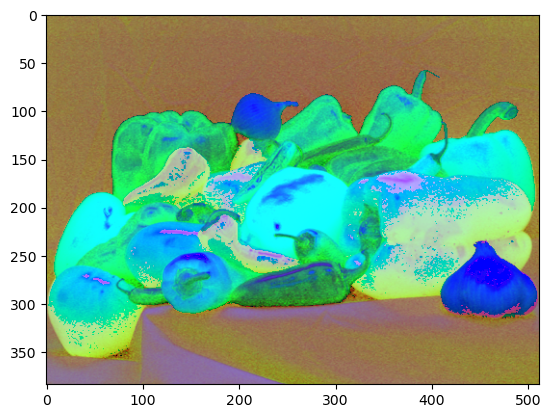

In [61]:
plt.imshow(task4_hsv, cmap='gray')
plt.show()

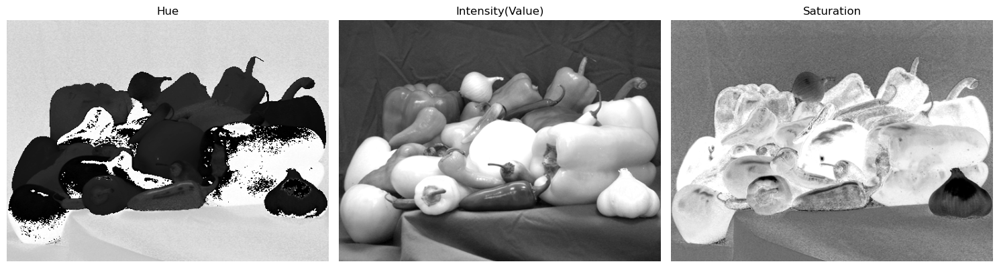

In [171]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

ax[0].imshow(task4_hsv[:,:,0], cmap='gray')
ax[0].set_title('Hue')
ax[0].axis('off')
ax[1].imshow(task4_hsv[:,:,2], cmap='gray')
ax[1].set_title('Intensity(Value)')
ax[1].axis('off')
ax[2].imshow(task4_hsv[:,:,1], cmap='gray')
ax[2].set_title('Saturation')
ax[2].axis('off')

plt.tight_layout()
plt.show()


## 5. make the I(x,y) uniformly distribution

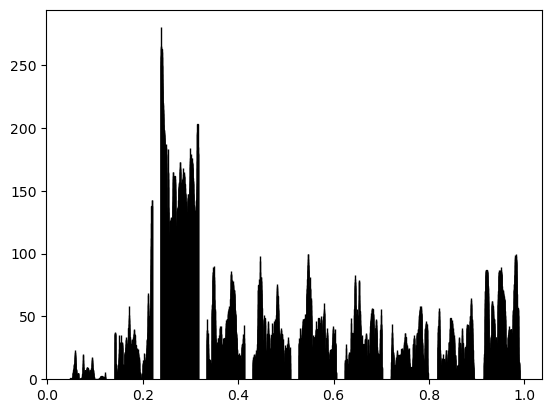

In [80]:
plt.hist(task4_hsv[:,:,2], fc='k', ec='k')
plt.show()

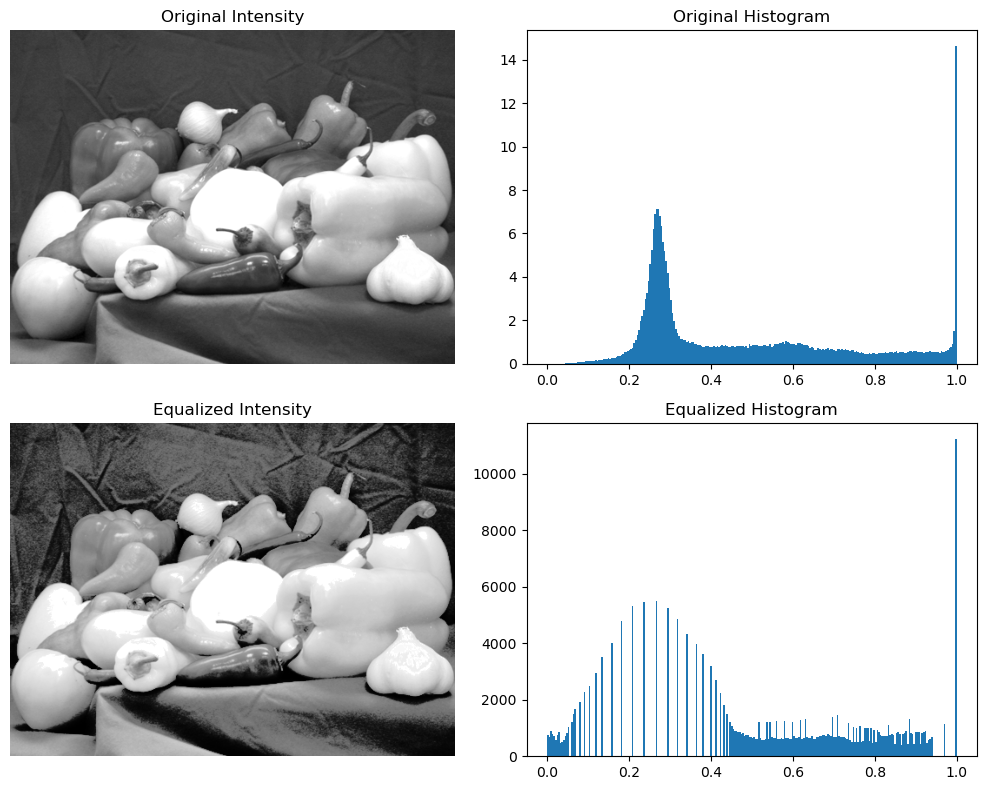

In [177]:
import skimage.exposure as exposure
I_equalized = exposure.equalize_hist(task4_hsv[:,:,2], nbins=256)
# I_equalized = exposure.equalize_hist(I_equalized, nbins=256)
fig, ax = plt.subplots(2, 2, figsize=(10, 8))
ax[0,0].imshow(task4_hsv[:,:,2], cmap='gray')
ax[0,0].set_title('Original Intensity')
ax[0,0].axis('off')
ax[0,1].hist(task4_hsv[:,:,2].ravel(), bins=256, range=(0, 1), density=True)
# ax[0,1].hist(task4_hsv[:,:,2], range=(0, 1), density=True, fc='k', ec='k')
ax[0,1].set_title('Original Histogram')
ax[1,0].imshow(I_equalized, cmap='gray')
ax[1,0].set_title('Equalized Intensity')
ax[1,0].axis('off')
ax[1,1].hist(I_equalized.ravel(), bins=256, range=(0, 1))
# ax[1,1].hist(I_equalized, range=(0, 1), fc='k', ec='k')
ax[1,1].set_title('Equalized Histogram')
plt.tight_layout()
plt.show()


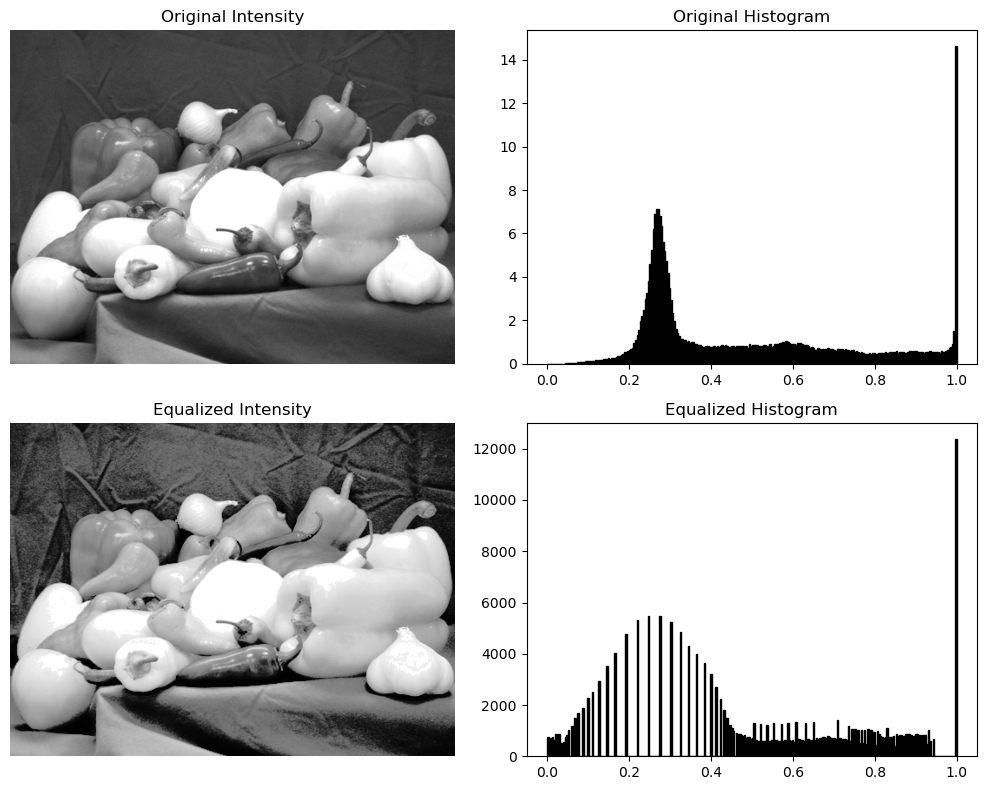

In [225]:
def histogram_equalization(img):
    hist, bins = np.histogram(img.flatten(), 256, [0, 1])
    pdf = hist / np.sum(hist)
    cdf = np.cumsum(pdf)
    img_eq = np.interp(img.flatten(), bins[:-1], cdf)
    img_eq = img_eq.reshape(img.shape)
    return img_eq

I_equalized = histogram_equalization(task4_hsv[:,:,2])

fig, ax = plt.subplots(2, 2, figsize=(10, 8))
ax[0,0].imshow(task4_hsv[:,:,2], cmap='gray')
ax[0,0].set_title('Original Intensity')
ax[0,0].axis('off')
ax[0,1].hist(task4_hsv[:,:,2].ravel(), bins=256, range=(0, 1), density=True, fc='k', ec='k')
# ax[0,1].hist(task4_hsv[:,:,2], range=(0, 1), density=True, fc='k', ec='k')
ax[0,1].set_title('Original Histogram')
ax[1,0].imshow(I_equalized, cmap='gray')
ax[1,0].set_title('Equalized Intensity')
ax[1,0].axis('off')
ax[1,1].hist(I_equalized.ravel(), bins=256, range=(0, 1), fc='k', ec='k')
# ax[1,1].hist(I_equalized, range=(0, 1), fc='k', ec='k')
ax[1,1].set_title('Equalized Histogram')
plt.tight_layout()
plt.show()

## 6. Gaussian

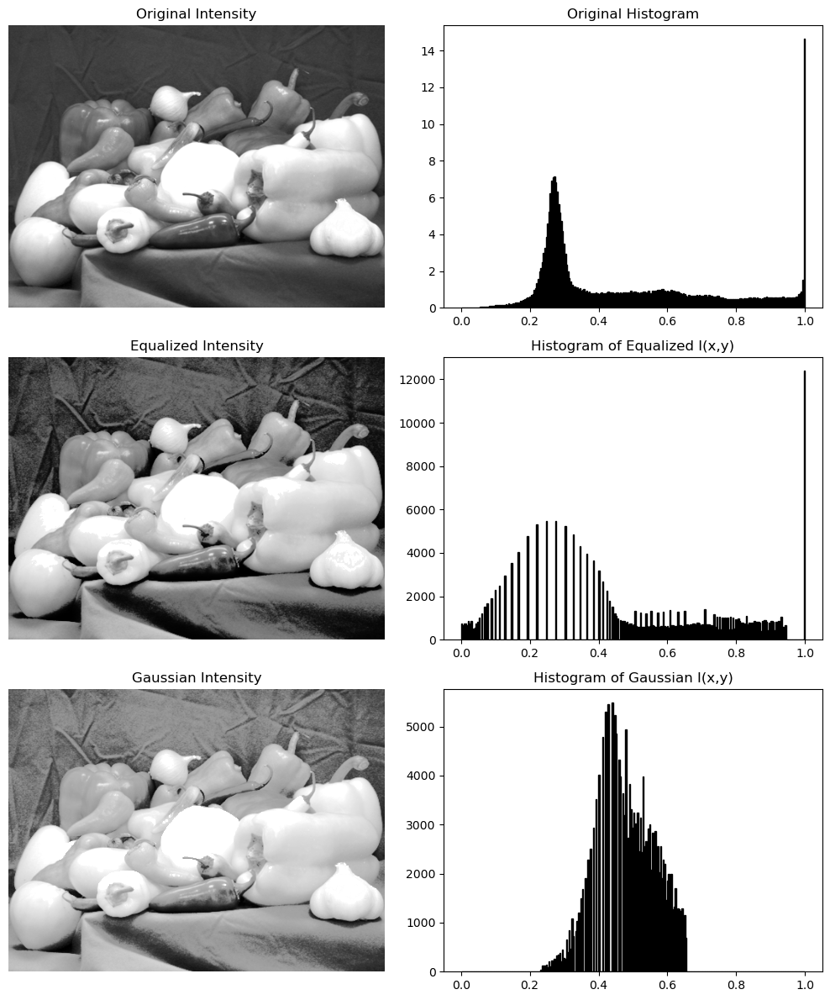

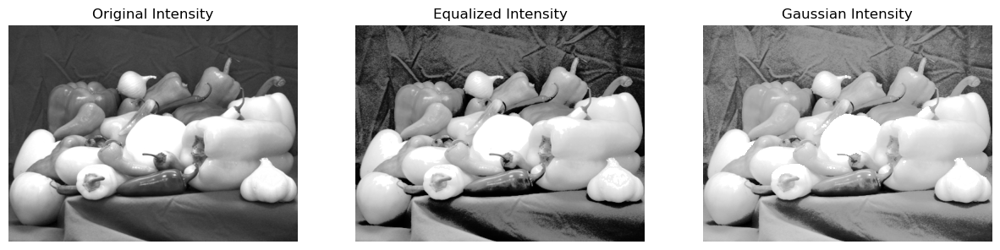

In [245]:
from skimage import exposure
from scipy.stats import norm

mean = 0.5
std = 0.1


hist, bin_edges = np.histogram(I_equalized, bins=256, range=(0, 1), density=True)
cdf = np.cumsum(hist) * (bin_edges[1] - bin_edges[0])

inverse_gaussian_cdf = norm.ppf(cdf, loc=mean, scale=std)
I_gaussian = np.interp(I_equalized.ravel(), bin_edges[:-1], inverse_gaussian_cdf).reshape(I_equalized.shape)

# I_gaussian_scaled = (I_gaussian - np.min(I_gaussian)) / (np.max(I_gaussian) - np.min(I_gaussian)) * 255
# I_gaussian_scaled = I_gaussian_scaled.astype(np.uint8)

fig, ax = plt.subplots(3, 2, figsize=(10, 12))

ax[0,0].imshow(task4_hsv[:,:,2], cmap='gray')
ax[0,0].set_title('Original Intensity')
ax[0,0].axis('off')

ax[0,1].hist(task4_hsv[:,:,2].ravel(), bins=256, range=(0, 1), density=True, fc='k', ec='k')
ax[0,1].set_title('Original Histogram')

ax[1,0].imshow(I_equalized, cmap='gray')
ax[1,0].set_title('Equalized Intensity')
ax[1,0].axis('off')

ax[1,1].hist(I_equalized.ravel(), bins=256, range=[0, 1], fc='k', ec='k')
ax[1,1].set_title('Histogram of Equalized I(x,y)')

ax[2,0].imshow(I_gaussian, cmap='gray')
ax[2,0].set_title('Gaussian Intensity')
ax[2,0].axis('off')

ax[2,1].hist(I_gaussian.ravel(), bins=256, range=[0, 1], fc='k', ec='k')
ax[2,1].set_title('Histogram of Gaussian I(x,y)')
plt.tight_layout()
plt.show()

fig , ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(task4_hsv[:,:,2], cmap='gray')
ax[0].set_title('Original Intensity')
ax[0].axis('off')
ax[1].imshow(I_equalized, cmap='gray')
ax[1].set_title('Equalized Intensity')
ax[1].axis('off')
ax[2].imshow(I_gaussian, cmap='gray')
ax[2].set_title('Gaussian Intensity')
ax[2].axis('off')
plt.show()

# Task 5

## 1. Load Data & 2. flatten

In [67]:
task5_data = np.load('Task5Data/idata.npy')
task5_data = task5_data.transpose(2, 0, 1)
task5_data.shape

(900, 224, 192)

In [68]:
task5_matrix = []
for d in task5_data:
    temp = d.flatten()
    task5_matrix.append(temp)
task5_matrix = np.array(task5_matrix)
task5_matrix = task5_matrix.T
task5_matrix.shape

(43008, 900)

## 3. extract only blood components

In [69]:
u, sigma, vt = np.linalg.svd(task5_matrix, full_matrices=False)

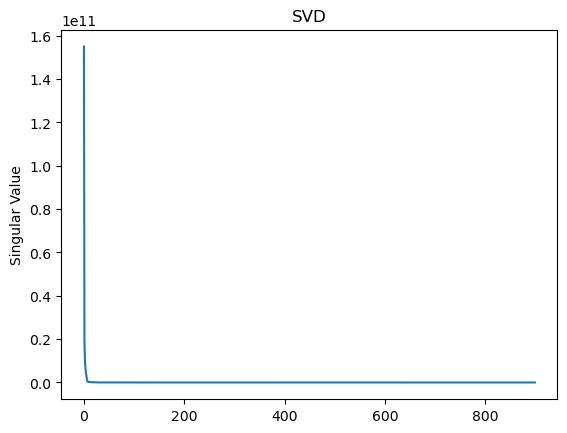

In [263]:
plt.plot(sigma)
# plt.xlabel('Index')
plt.ylabel('Singular Value')
plt.title('SVD')
plt.show()

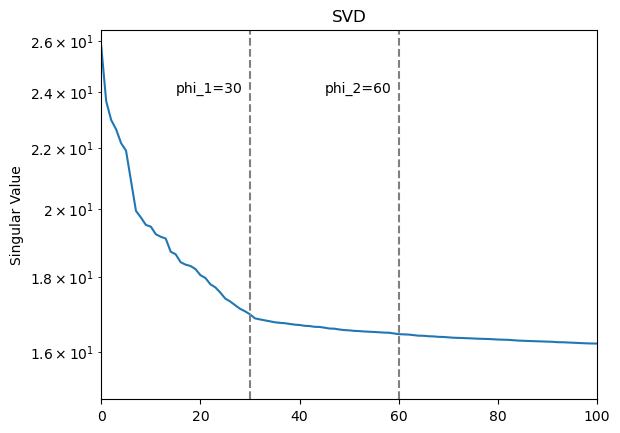

In [283]:
plt.plot(np.log(sigma))
# plt.xlabel('Index')
plt.xlim(0, 100)
plt.yscale('log')
plt.ylabel('Singular Value')
plt.axvline(x=30, color='gray', linestyle='--')
plt.axvline(x=60, color='gray', linestyle='--')
plt.text(15, 24, 'phi_1=30', color='black')
plt.text(45, 24, 'phi_2=60', color='black')
plt.title('SVD')
plt.show()

In [71]:
phi_1 = 30
phi_2 = 60

blood = np.zeros_like(task5_matrix)
for i in range(phi_1, phi_2):
    blood += sigma[i] * np.outer(u[:, i], vt[i, :])
blood.shape

(43008, 900)

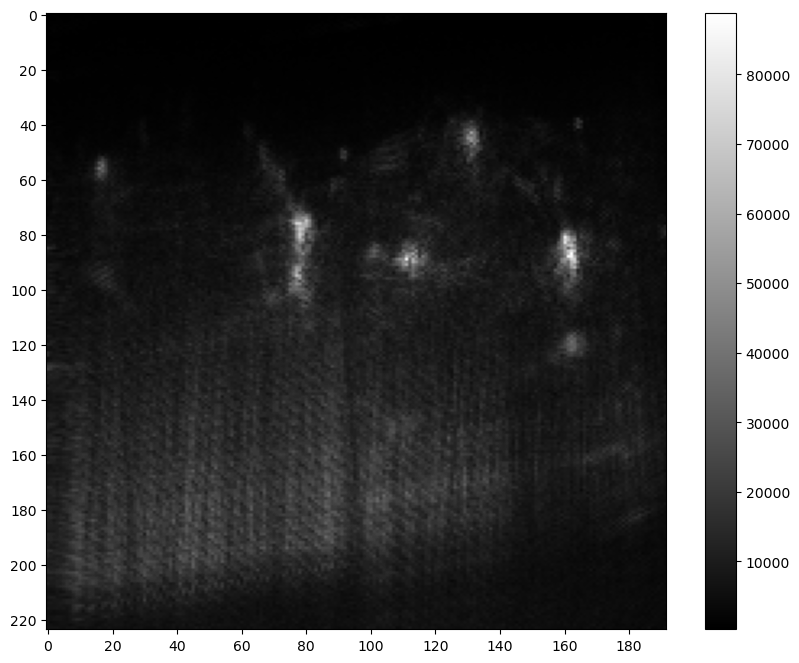

In [72]:
blood_abs = np.abs(blood)
blood_avg = np.mean(blood_abs, axis=1)
blood_img = blood_avg.reshape(224, 192)
plt.figure(figsize=(10, 8))
plt.imshow(blood_img, cmap='gray', aspect='auto')
plt.xticks(np.arange(0, 192, 20))
plt.yticks(np.arange(0, 224, 20))
plt.colorbar()
plt.show()


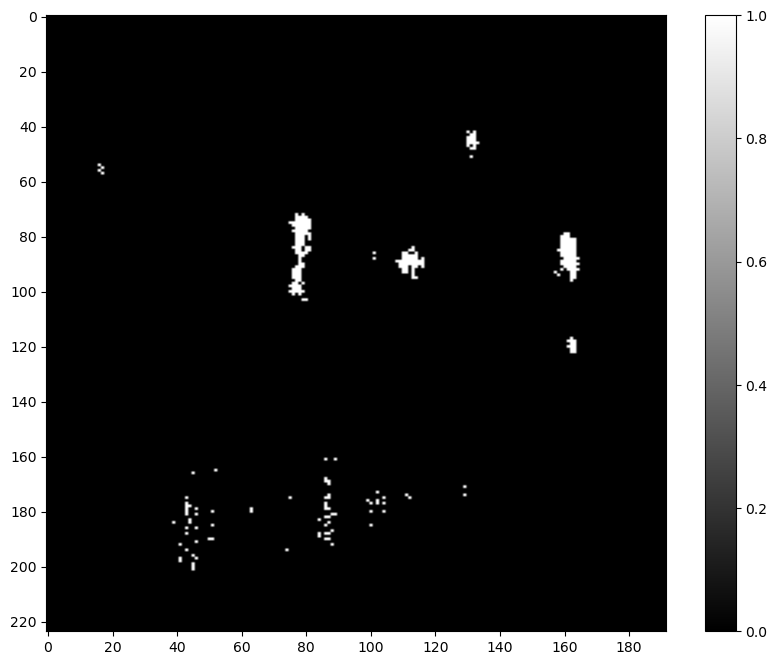

In [73]:
blood_filter = blood_img > 30000
blood_filter = blood_filter.astype(np.uint8)
plt.figure(figsize=(10, 8))
plt.imshow(blood_filter, cmap='gray', aspect='auto')
plt.xticks(np.arange(0, 192, 20))
plt.yticks(np.arange(0, 224, 20))
plt.colorbar()
plt.show()

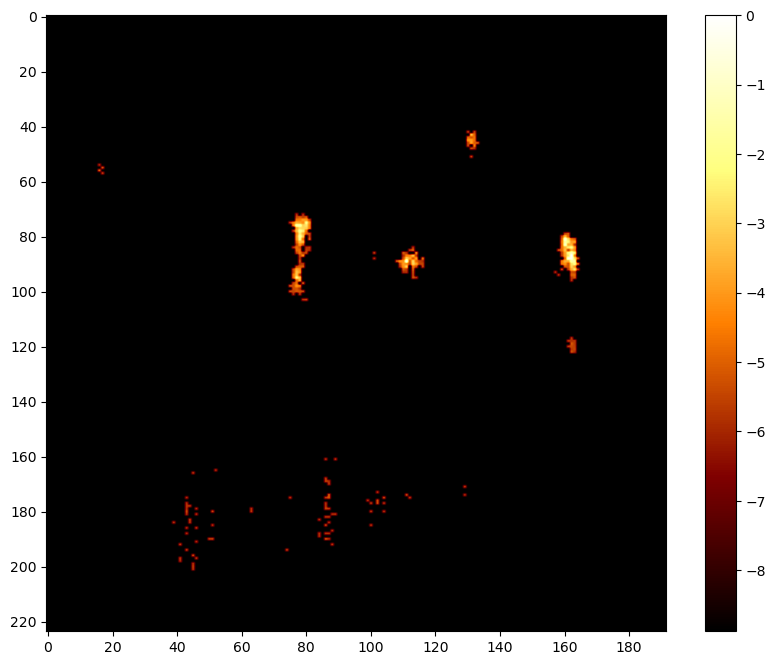

In [74]:
filtered_blood_img = blood_img * blood_filter
filtered_blood_img = (filtered_blood_img - np.max(filtered_blood_img)) / 10000
plt.figure(figsize=(10, 8))
plt.imshow(filtered_blood_img, cmap='afmhot', aspect='auto')
plt.xticks(np.arange(0, 192, 20))
plt.yticks(np.arange(0, 224, 20))
plt.colorbar()
plt.show()